In [3]:
import os
from mintpy.cli import view, tsview, plot_network, plot_transection
from mintpy.utils import utils as ut, plot as pp

In [4]:
os.getcwd()

'/home/jovyan/chapter_3/humla_2017_2024_utm'

In [5]:
# folder structure for mintpy
mint_path = f'{os.getcwd()}/MintPy'

In [6]:
os.chdir(mint_path)
print(f'working direcctory is {os.getcwd()}')

working direcctory is /home/jovyan/chapter_3/humla_2017_2024_utm/MintPy


In [33]:
h5_geom=f'{mint_path}/inputs/geometryGeo.h5'
h5_interferogram=f'{mint_path}/inputs/ifgramStack.h5'

view.py /home/jovyan/chapter_3/humla_2017_2024_utm/MintPy/inputs/geometryGeo.h5 --noverbose --figsize 4 4


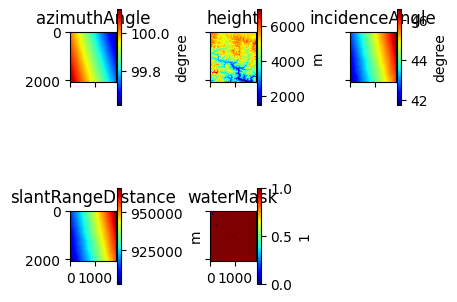

In [9]:
%matplotlib inline
view.main(f'{h5_geom} --noverbose --figsize 4 4'.split())

view.py /home/jovyan/chapter_3/humla_2017_2024_utm/MintPy/inputs/geometryGeo.h5 --noverbose --figsize 4 4


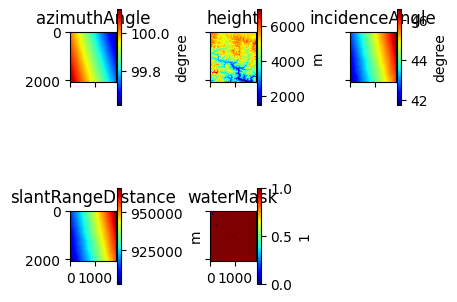

In [20]:
%matplotlib inline
view.main(f'{h5_geom} --noverbose --figsize 4 4'.split())

In [11]:
import pandas as pd
import re

# Define the file path
file_path = f"coherenceSpatialAvg.txt"  # Update with your actual file path

# Read the file and extract the data portion (ignoring metadata)
with open(file_path, "r") as file:
    lines = file.readlines()

# Find the starting index of the actual data
start_idx = next(i for i, line in enumerate(lines) if re.match(r'\d{8}_\d{8}', line))

# Read the data into a DataFrame
df_date = pd.read_csv(
    file_path,
    delim_whitespace=True,
    skiprows=start_idx,
    names=["DATE12", "Mean", "Btemp/days", "Bperp/m", "Num"]
)

# Split DATE12 into DATE1 and DATE2
df_date[['DATE1', 'DATE2']] = df_date['DATE12'].str.split('_', expand=True)

/tmp/ipykernel_730/4054485829.py:15: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df_date = pd.read_csv(


In [12]:
df_date.head()

,DATE12,Mean,Btemp/days,Bperp/m,Num,DATE1,DATE2
0,20170607_20170619,0.6668,12,-13.0,0,20170607,20170619
1,20170607_20170701,0.6355,24,6.2,1,20170607,20170701
2,20170619_20170701,0.7096,12,19.2,2,20170619,20170701
3,20170619_20170713,0.5945,24,45.2,3,20170619,20170713
4,20170701_20170713,0.6937,12,25.9,4,20170701,20170713


## Specific year

151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173
run view.py in MintPy version 1.6.1, date 2024-07-31
input file is ifgramStack file: /home/jovyan/chapter_3/humla_2017_2024_utm/MintPy/inputs/ifgramStack.h5 in float32 format
file size in y/x: (2065, 1868)
num of datasets in file ifgramStack.h5: 348
num of datasets to exclude: 0
num of datasets to display: 23
data   coverage in y/x: (0, 0, 1868, 2065)
subset coverage in y/x: (0, 0, 1868, 2065)
data   coverage in lat/lon: (537420.0, 3374260.0, 612140.0, 3291660.0)
subset coverage in lat/lon: (537420.0, 3374260.0, 612140.0, 3291660.0)
------------------------------------------------------------------------
area exceed 2000 pixels, turn off default DEM contour display
colormap: jet
figure title: unwrapPhase_wrap
figure size : [15.00, 8.00]
dataset number: 23
row     number: 4
column  number: 7
figure  number: 1
total number of pixels: 1.1E+08
* multilook 2 by 2 with nearest interpolation for displa

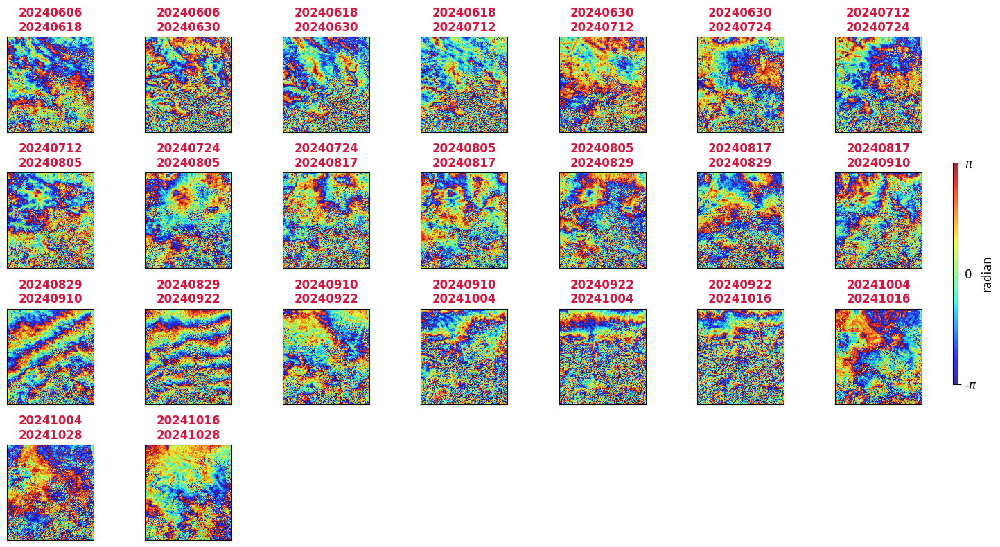

In [13]:
year=2024

mask = df_date['DATE1'].astype(str).str.startswith(str(year)) | df_date['DATE2'].astype(str).str.startswith(str(year))
indices_year = df_date.index[mask].tolist()
img_indx_year = ' '.join(map(str, indices_year))
print(img_indx_year)

view.main(f'./inputs/ifgramStack.h5 -d ./inputs/geometryGeo.h5 --wrap -n {img_indx_year}'.split())

## select specific year, specific months

2 4 6 8 10 12 14
run view.py in MintPy version 1.6.1, date 2024-07-31
input file is ifgramStack file: /home/jovyan/chapter_3/humla_2017_2024_utm/MintPy/inputs/ifgramStack.h5 in float32 format
file size in y/x: (2065, 1868)
num of datasets in file ifgramStack.h5: 348
num of datasets to exclude: 0
num of datasets to display: 7
data   coverage in y/x: (0, 0, 1868, 2065)
subset coverage in y/x: (0, 0, 1868, 2065)
data   coverage in lat/lon: (537420.0, 3374260.0, 612140.0, 3291660.0)
subset coverage in lat/lon: (537420.0, 3374260.0, 612140.0, 3291660.0)
------------------------------------------------------------------------
area exceed 2000 pixels, turn off default DEM contour display
colormap: jet
figure title: unwrapPhase_wrap
figure size : [15.00, 8.00]
dataset number: 7
row     number: 2
column  number: 4
figure  number: 1
consider reference pixel in y/x: [718, 495]
mark interferograms with 'dropIfgram=False' in red colored title
reading DEM: geometryGeo.h5 ... 
show shaded relief DEM 

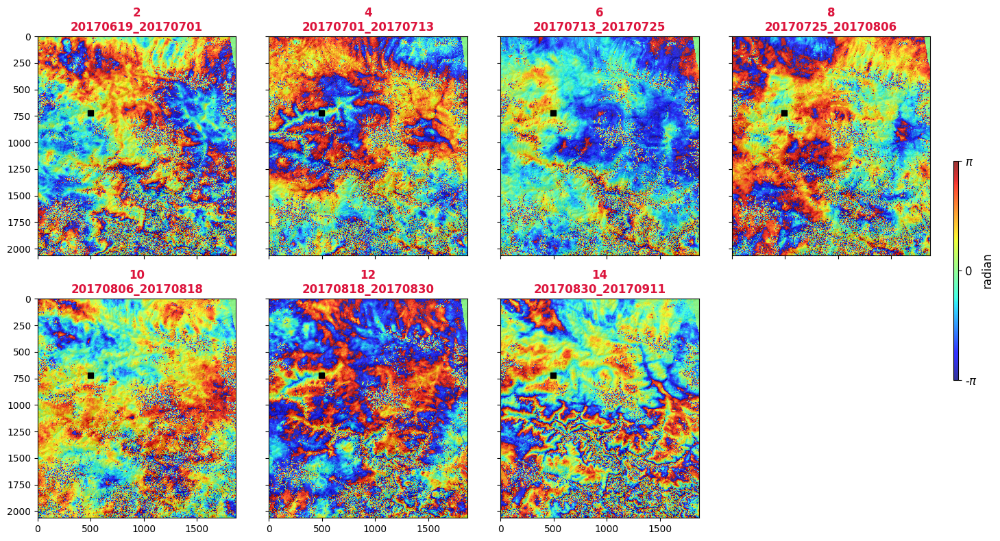

In [19]:
# just visualize interferogram from specific months
months = [7, 8]
year = 2017

df_date['DATE1'] = pd.to_datetime(df_date['DATE1'], format='%Y%m%d')
df_date['DATE2'] = pd.to_datetime(df_date['DATE2'], format='%Y%m%d')


subset = df_date[df_date['Btemp/days'] == 12]


mask = (
    ((subset['DATE1'].dt.year == year) & subset['DATE1'].dt.month.isin(months)) |
    ((subset['DATE2'].dt.year == year) & subset['DATE2'].dt.month.isin(months))
)

indices_ym = subset.index[mask].tolist()
img_indx_ym = ' '.join(map(str, indices_ym))
print(img_indx_ym)

view.main(f'./inputs/ifgramStack.h5 -d ./inputs/geometryGeo.h5 --wrap -n {img_indx_ym}'.split())

88 90 92 94
run view.py in MintPy version 1.6.1, date 2024-07-31
input file is ifgramStack file: /home/jovyan/chapter_3/humla_2017_2024_utm/MintPy/inputs/ifgramStack.h5 in float32 format
file size in y/x: (2065, 1868)
num of datasets in file ifgramStack.h5: 348
num of datasets to exclude: 0
num of datasets to display: 4
data   coverage in y/x: (0, 0, 1868, 2065)
subset coverage in y/x: (0, 0, 1868, 2065)
data   coverage in lat/lon: (537420.0, 3374260.0, 612140.0, 3291660.0)
subset coverage in lat/lon: (537420.0, 3374260.0, 612140.0, 3291660.0)
------------------------------------------------------------------------
area exceed 2000 pixels, turn off default DEM contour display
colormap: jet
figure title: unwrapPhase
figure size : [15.00, 8.00]
dataset number: 4
row     number: 1
column  number: 4
figure  number: 1
row number is 1, adjust figure size to [10.0, 2.2]
consider reference pixel in y/x: [718, 495]
mark interferograms with 'dropIfgram=False' in red colored title
reading DEM: ge

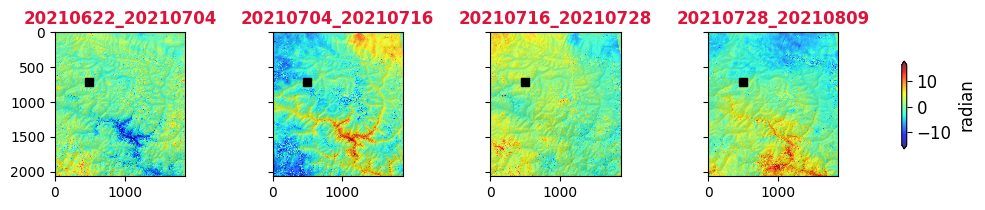

In [77]:
# just visualize interferogram from specific months
months = [7]
year = 2021

df_date['DATE1'] = pd.to_datetime(df_date['DATE1'], format='%Y%m%d')
df_date['DATE2'] = pd.to_datetime(df_date['DATE2'], format='%Y%m%d')


subset = df_date[df_date['Btemp/days'] == 12]


mask = (
    ((subset['DATE1'].dt.year == year) & subset['DATE1'].dt.month.isin(months)) |
    ((subset['DATE2'].dt.year == year) & subset['DATE2'].dt.month.isin(months))
)

indices_ym = subset.index[mask].tolist()
img_indx_ym = ' '.join(map(str, indices_ym))
print(img_indx_ym)

# view.main(f'./inputs/ifgramStack.h5 -d ./inputs/geometryGeo.h5 --wrap -n {img_indx_ym}'.split())
view.main(f'./inputs/ifgramStack.h5 -d ./inputs/geometryGeo.h5 -n {img_indx_ym}'.split())

## select ALL years, ONLY August

8 10 12 14 27 29 31 33 50 52 54 71 73 75 77 94 96 98 115 117 119 121 138 140 142 159 161 163 165
run view.py in MintPy version 1.6.1, date 2024-07-31
input file is ifgramStack file: /home/jovyan/chapter_3/humla_2017_2024_utm/MintPy/inputs/ifgramStack.h5 in float32 format
file size in y/x: (2065, 1868)
num of datasets in file ifgramStack.h5: 348
num of datasets to exclude: 0
num of datasets to display: 29
data   coverage in y/x: (0, 0, 1868, 2065)
subset coverage in y/x: (0, 0, 1868, 2065)
data   coverage in lat/lon: (537420.0, 3374260.0, 612140.0, 3291660.0)
subset coverage in lat/lon: (537420.0, 3374260.0, 612140.0, 3291660.0)
------------------------------------------------------------------------
area exceed 2000 pixels, turn off default DEM contour display
colormap: jet
figure title: unwrapPhase_wrap
figure size : [15.00, 8.00]
dataset number: 29
row     number: 4
column  number: 8
figure  number: 1
total number of pixels: 1.2E+08
* multilook 2 by 2 with nearest interpolation for d

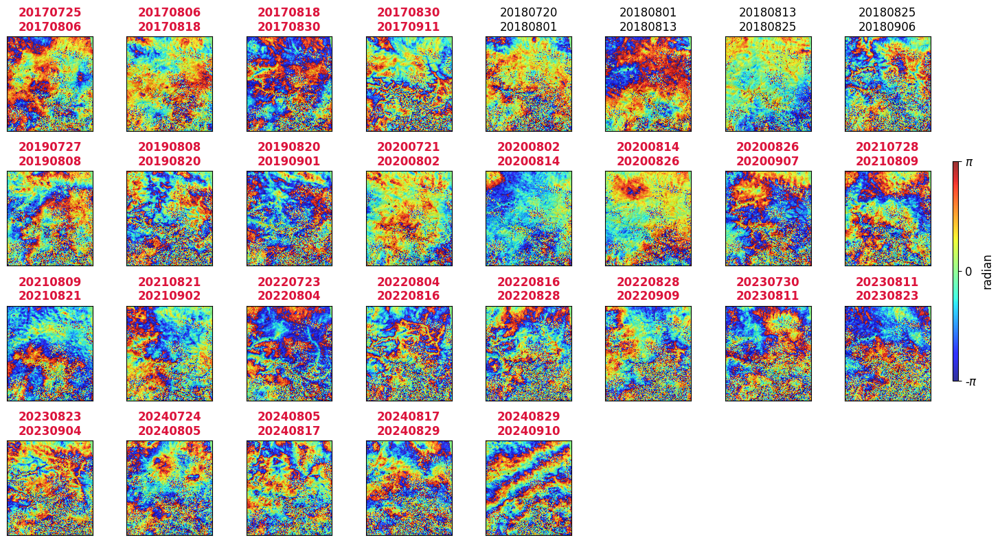

In [16]:
# Convert date columns
df_date['DATE1'] = pd.to_datetime(df_date['DATE1'], format='%Y%m%d')
df_date['DATE2'] = pd.to_datetime(df_date['DATE2'], format='%Y%m%d')

# Filter for Btemp/days = 12
subset = df_date[df_date['Btemp/days'] == 12]

# Select only August (month = 8) for DATE1 or DATE2
mask = (
    (subset['DATE1'].dt.month == 8) |
    (subset['DATE2'].dt.month == 8)
)

indices_ym = subset.index[mask].tolist()
img_indx_ym = ' '.join(map(str, indices_ym))
print(img_indx_ym)

view.main(f'./inputs/ifgramStack.h5 -d ./inputs/geometryGeo.h5 --wrap -n {img_indx_ym}'.split())


## Filter for all years, only August & September

8 10 12 14 16 27 29 31 33 35 37 39 50 52 54 56 58 60 71 73 75 77 79 81 94 96 98 100 102 104 115 117 119 121 123 125 138 140 142 144 146 148 159 161 163 165 167 169
run view.py in MintPy version 1.6.1, date 2024-07-31
input file is ifgramStack file: /home/jovyan/chapter_3/humla_2017_2024_utm/MintPy/inputs/ifgramStack.h5 in float32 format
file size in y/x: (2065, 1868)
num of datasets in file ifgramStack.h5: 348
num of datasets to exclude: 0
num of datasets to display: 48
data   coverage in y/x: (0, 0, 1868, 2065)
subset coverage in y/x: (0, 0, 1868, 2065)
data   coverage in lat/lon: (537420.0, 3374260.0, 612140.0, 3291660.0)
subset coverage in lat/lon: (537420.0, 3374260.0, 612140.0, 3291660.0)
------------------------------------------------------------------------
area exceed 2000 pixels, turn off default DEM contour display
colormap: jet
figure title: unwrapPhase_wrap
figure size : [15.00, 8.00]
dataset number: 48
row     number: 5
column  number: 10
figure  number: 1
total number of

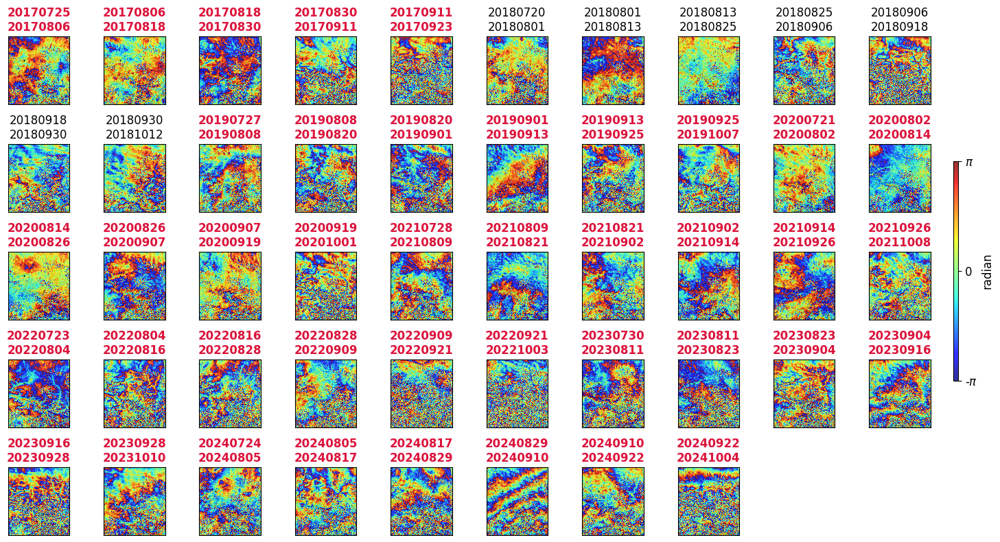

In [17]:
# Convert dates
df_date['DATE1'] = pd.to_datetime(df_date['DATE1'], format='%Y%m%d')
df_date['DATE2'] = pd.to_datetime(df_date['DATE2'], format='%Y%m%d')

# Filter for Btemp/days = 12
subset = df_date[df_date['Btemp/days'] == 12]

# Months you want
months = [8, 9]   # August = 8, September = 9

# Create mask for DATE1 or DATE2 in Aug/Sep (any year)
mask = (
    subset['DATE1'].dt.month.isin(months) |
    subset['DATE2'].dt.month.isin(months)
)

# Get indices for mintpy viewer
indices_ym = subset.index[mask].tolist()
img_indx_ym = ' '.join(map(str, indices_ym))

print(img_indx_ym)

# Visualize
view.main(f'./inputs/ifgramStack.h5 -d ./inputs/geometryGeo.h5 --wrap -n {img_indx_ym}'.split())


In [35]:
!info.py {h5_interferogram}

******************** Basic File Info ************************
file name: /home/jovyan/chapter_3/humla_2017_2024_utm/MintPy/inputs/ifgramStack.h5
file type: ifgramStack
coordinates : GEO

******************** HDF5 File Structure ********************
Attributes in / level:
  ALOOKS                       2
  ANTENNA_SIDE                 -1
  AZIMUTH_PIXEL_SIZE           28.2
  BANDS                        1
  CENTER_LINE_UTC              45534.173564
  DATA_TYPE                    float32
  DATE12                       170607-170619
  EARTH_RADIUS                 6372916.5658
  EPSG                         32644
  FILE_LENGTH                  2065
  FILE_PATH                    /home/jovyan/humla_2017_2024_utm/S1AA_20170607T123852_20170619T123853_VVP012_INT40_G_ueF_F520/S1AA_20170607T123852_20170619T123853_VVP012_INT40_G_ueF_F520_unw_phase_clip.tif
  FILE_TYPE                    ifgramStack
  HEADING                      -12.715861399999994
  HEIGHT                       699281.517
  INTE

In [36]:
import xarray as xr
import h5py
import datetime as dt
from datetime import datetime
import matplotlib.pyplot as plt
import numpy as np

def process_ifgram_stack(file_path):
    """
    Process an ifgramStack.h5 file into an xarray Dataset, renaming dimensions,
    converting the first column of 'date' to datetime objects, and assigning
    Date, latitude, and longitude coordinates.
    
    Parameters:
    -----------
    file_path : str
        Path to the ifgramStack.h5 file.
        
    Returns:
    --------
    ds : xarray.Dataset
        Processed dataset with renamed dimensions and assigned coordinates.
    """
    def coord_range(df, coord):
        """
        Compute coordinate range for latitude or longitude based on dataset metadata.
        
        Parameters:
        -----------
        df : xarray.Dataset
            Dataset containing metadata attributes (X_FIRST, X_STEP, Y_FIRST, Y_STEP, WIDTH, LENGTH).
        coord : str
            Coordinate type ('lat', 'latitude', 'lon', or 'longitude').
            
        Returns:
        --------
        numpy.ndarray
            Array of coordinate values.
        """
        if coord == 'lat' or coord == 'latitude':
            latrange = np.linspace(
                float(df.attrs['Y_FIRST']),
                float(df.attrs['Y_FIRST']) + float(df.attrs['Y_STEP']) * float(df.attrs['LENGTH']),
                int(df.attrs['LENGTH'])
            )
            return latrange
        elif coord == 'lon' or coord == 'longitude':
            lonrange = np.linspace(
                float(df.attrs['X_FIRST']),
                float(df.attrs['X_FIRST']) + float(df.attrs['X_STEP']) * float(df.attrs['WIDTH']),
                int(df.attrs['WIDTH'])
            )
            return lonrange
        else:
            raise ValueError("coord must be 'lat', 'latitude', 'lon', or 'longitude'")

    # Open the dataset
    ds = xr.open_dataset(file_path, engine='h5netcdf', phony_dims='sort', decode_coords="all")

    # Rename dimensions
    ds = ds.rename_dims({
        'phony_dim_0': 'Date',
        'phony_dim_1': 'latitude',
        'phony_dim_2': 'longitude'
    })

    # Extract the first column of the 'date' variable
    first_date = ds['date'].values[:, 0]
    last_date = ds['date'].values[:, 1]

    # Convert byte strings to datetime objects
    date_t1 = [datetime.strptime(date.decode('utf-8'), '%Y%m%d') for date in first_date]
    date_t2 = [datetime.strptime(date.decode('utf-8'), '%Y%m%d') for date in last_date]

    # Assign coordinates
    ds = ds.assign_coords({
        'Date': ('Date', np.array(date_t1)),
        'latitude': ('latitude', coord_range(ds, 'latitude')),
        'longitude': ('longitude', coord_range(ds, 'longitude'))
    })

    return ds,date_t1,date_t2

In [41]:
df_ifgramStack,t1,t2 = process_ifgram_stack(h5_interferogram)

# Print the dataset to verify
print(df_ifgramStack)

<xarray.Dataset> Size: 5GB
Dimensions:      (Date: 174, latitude: 2065, longitude: 1868, phony_dim_3: 2)
Coordinates:
  * Date         (Date) datetime64[ns] 1kB 2017-06-07 2017-06-07 ... 2024-10-16
  * latitude     (latitude) float64 17kB 3.374e+06 3.374e+06 ... 3.292e+06
  * longitude    (longitude) float64 15kB 5.374e+05 5.375e+05 ... 6.121e+05
Dimensions without coordinates: phony_dim_3
Data variables:
    bperp        (Date) float32 696B ...
    coherence    (Date, latitude, longitude) float32 3GB ...
    date         (Date, phony_dim_3) |S8 3kB b'20170607' ... b'20241028'
    dropIfgram   (Date) bool 174B ...
    unwrapPhase  (Date, latitude, longitude) float32 3GB ...
Attributes: (12/61)
    ALOOKS:                     2
    ANTENNA_SIDE:               -1
    AZIMUTH_PIXEL_SIZE:         28.2
    BANDS:                      1
    CENTER_LINE_UTC:            45534.173564
    DATA_TYPE:                  float32
    ...                         ...
    mintpy.load.unwFile:        /hom

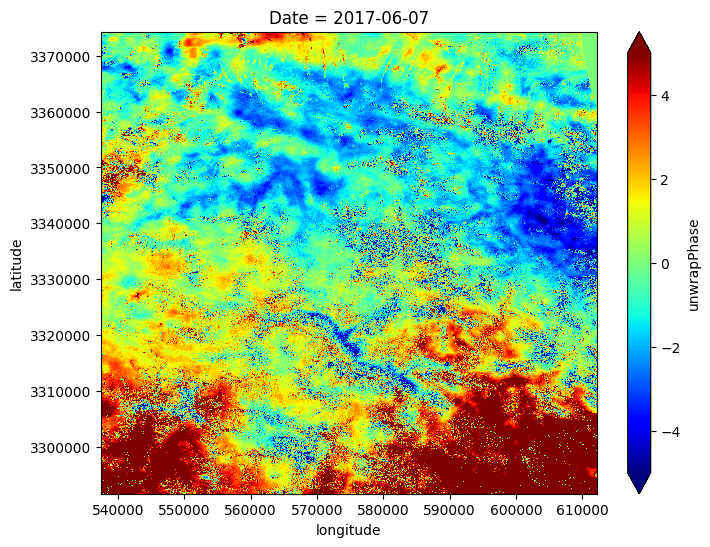

In [67]:
df_ifgramStack.isel(Date=0).unwrapPhase.plot.imshow( cmap='jet',figsize=(8, 6),vmin=-5,vmax=5)

In [68]:
import xarray as xr
import numpy as np
from datetime import datetime

def xarray_ifgram_stack(file_path):
    """
    Process an ifgramStack.h5 file into an xarray Dataset, renaming dimensions,
    converting the first/second column of 'date' to datetime objects, and assigning
    Date, latitude, and longitude coordinates.
    
    Parameters
    ----------
    file_path : str
        Path to the ifgramStack.h5 file.
        
    Returns
    -------
    ds : xarray.Dataset
        Processed dataset with renamed dimensions and assigned coordinates.
    date_t1 : list[datetime]
        List of datetime objects for the first date in each interferogram (DATE1).
    date_t2 : list[datetime]
        List of datetime objects for the second date in each interferogram (DATE2).
    """

    def coord_range(ds, coord):
        """
        Compute coordinate range for latitude or longitude based on dataset metadata.
        
        Uses MintPy-style attrs:
            Y_FIRST, Y_STEP, LENGTH  -> latitude
            X_FIRST, X_STEP, WIDTH   -> longitude
        """
        if coord in ('lat', 'latitude'):
            y_first = float(ds.attrs['Y_FIRST'])
            y_step  = float(ds.attrs['Y_STEP'])
            n_y     = int(ds.attrs['LENGTH'])
            # index-based, avoids off-by-one: [0 .. n_y-1]
            return y_first + np.arange(n_y) * y_step

        elif coord in ('lon', 'longitude'):
            x_first = float(ds.attrs['X_FIRST'])
            x_step  = float(ds.attrs['X_STEP'])
            n_x     = int(ds.attrs['WIDTH'])
            return x_first + np.arange(n_x) * x_step

        else:
            raise ValueError("coord must be 'lat', 'latitude', 'lon', or 'longitude'")

    # Open the dataset
    ds = xr.open_dataset(file_path, engine='h5netcdf', phony_dims='sort', decode_coords="all")

    # Rename dimensions (MintPy ifgramStack: [ifgram, y, x])
    ds = ds.rename_dims({
        'phony_dim_0': 'Date',      # actually: interferogram index
        'phony_dim_1': 'latitude',
        'phony_dim_2': 'longitude'
    })

    # Extract the two date columns from 'date' variable (shape: [n_ifg, 2])
    date_bytes = ds['date'].values
    first_date = date_bytes[:, 0]
    last_date  = date_bytes[:, 1]

    # Robust parser: try both YYYYMMDD and YYMMDD
    def parse_date(b):
        s = b.decode('utf-8')
        for fmt in ('%Y%m%d', '%y%m%d'):
            try:
                return datetime.strptime(s, fmt)
            except ValueError:
                continue
        raise ValueError(f"Unknown date format: {s}")

    date_t1 = [parse_date(d) for d in first_date]  # DATE1
    date_t2 = [parse_date(d) for d in last_date]   # DATE2

    # Assign coordinates: 
    # - 'Date' coord = DATE1 (first date per interferogram)
    # - build latitude/longitude from file attrs
    ds = ds.assign_coords({
        # 'Date':      ('Date', np.array(date_t1)),
        'latitude':  ('latitude', coord_range(ds, 'latitude')),
        'longitude': ('longitude', coord_range(ds, 'longitude')),
    })

    # Optionally also keep DATE2 as a separate coord (handy for filtering)
    ds = ds.assign_coords({
        't1': ('Date', np.array(date_t1)),
        't2': ('Date', np.array(date_t2)),
    })

    return ds, date_t1, date_t2


In [69]:
ds, date_t1, date_t2 = xarray_ifgram_stack(h5_interferogram)

In [70]:
# Get the unwrapPhase data array
phase = ds['unwrapPhase']

# Example: select an interferogram whose DATE1 is in August or September (all years)
months = [8, 9]
mask = ds['t1'].dt.month.isin(months) | ds['t2'].dt.month.isin(months)

phase_aug_sep = phase.sel(Date=mask)

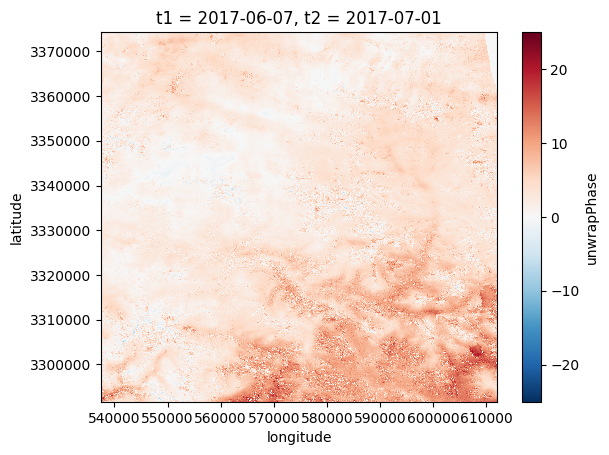

In [74]:
i = 1  # first interferogram
phase.isel(Date=i).plot()
plt.show()

In [72]:
import matplotlib.pyplot as plt

# Boolean mask: DATE1 or DATE2 in August (month == 8)
mask_aug = (ds['t1'].dt.month == 8) | (ds['t2'].dt.month == 8)

# Subset dataset
ds_aug = ds.sel(Date=mask_aug)

print(f"Number of August interferograms: {ds_aug.dims['Date']}")


Number of August interferograms: 66


/tmp/ipykernel_730/3766724203.py:9: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  print(f"Number of August interferograms: {ds_aug.dims['Date']}")


In [73]:
ds_aug

<xarray.Dataset> Size: 2GB
Dimensions:      (Date: 66, latitude: 2065, longitude: 1868, phony_dim_3: 2)
Coordinates:
  * latitude     (latitude) float64 17kB 3.374e+06 3.374e+06 ... 3.292e+06
  * longitude    (longitude) float64 15kB 5.374e+05 5.375e+05 ... 6.121e+05
    t1           (Date) datetime64[ns] 528B 2017-07-13 2017-07-25 ... 2024-08-29
    t2           (Date) datetime64[ns] 528B 2017-08-06 2017-08-06 ... 2024-09-22
Dimensions without coordinates: Date, phony_dim_3
Data variables:
    bperp        (Date) float32 264B ...
    coherence    (Date, latitude, longitude) float32 1GB ...
    date         (Date, phony_dim_3) |S8 1kB b'20170713' ... b'20240922'
    dropIfgram   (Date) bool 66B ...
    unwrapPhase  (Date, latitude, longitude) float32 1GB ...
Attributes: (12/61)
    ALOOKS:                     2
    ANTENNA_SIDE:               -1
    AZIMUTH_PIXEL_SIZE:         28.2
    BANDS:                      1
    CENTER_LINE_UTC:            45534.173564
    DATA_TYPE:                  float32
    ...                         ...
    mintpy.load.unwFile:        /home/jovyan/humla_2017_2024_utm/*/*_unw_phas...
    mintpy.load.waterMaskFile:  /home/jovyan/humla_2017_2024_utm/*/*_water_ma...
    relative_orbit:             56
    startUTC:                   2017-06-07 12:38:52.000000
    stopUTC:                    2017-06-07 12:39:19.000000
    unwrap_method:              mcf